In [53]:
import requests
from PIL import Image
from io import BytesIO

In [54]:
def download_img(url):
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    return img


In [55]:
im1 = download_img('https://wallpapercave.com/wp/AmzdkG9.jpg')
im1.save('image.png')

In [56]:
im2 = Image.open(r"C:\Users\ACER\Pictures\60f0a82c85e44604ac42f84754a3861d.jpg") # r is for eaw string
im2.size

(1080, 810)

In [57]:
im2.show()

In [58]:
im2.info

{'jfif': 257,
 'jfif_version': (1, 1),
 'jfif_unit': 0,
 'jfif_density': (1, 1),
 'progressive': 1,
 'progression': 1}

In [59]:
im2.mode #RGB

'RGB'

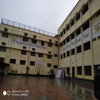

In [60]:
# resize image
im2.resize((100,100))

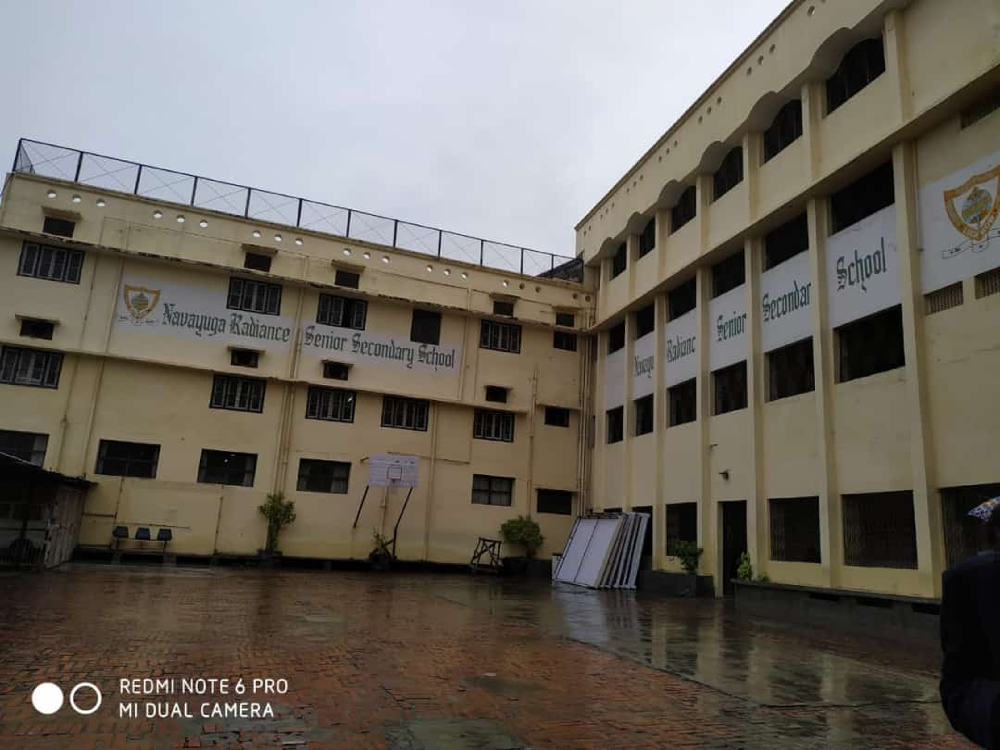

In [61]:
im2.resize(( 3* im2.width, 3* im2.height ))

In [62]:
im2.resize(( im2.width//3,  im2.height//3)).save('image3.png')

In [63]:
from PIL import ImageDraw, ImageFont

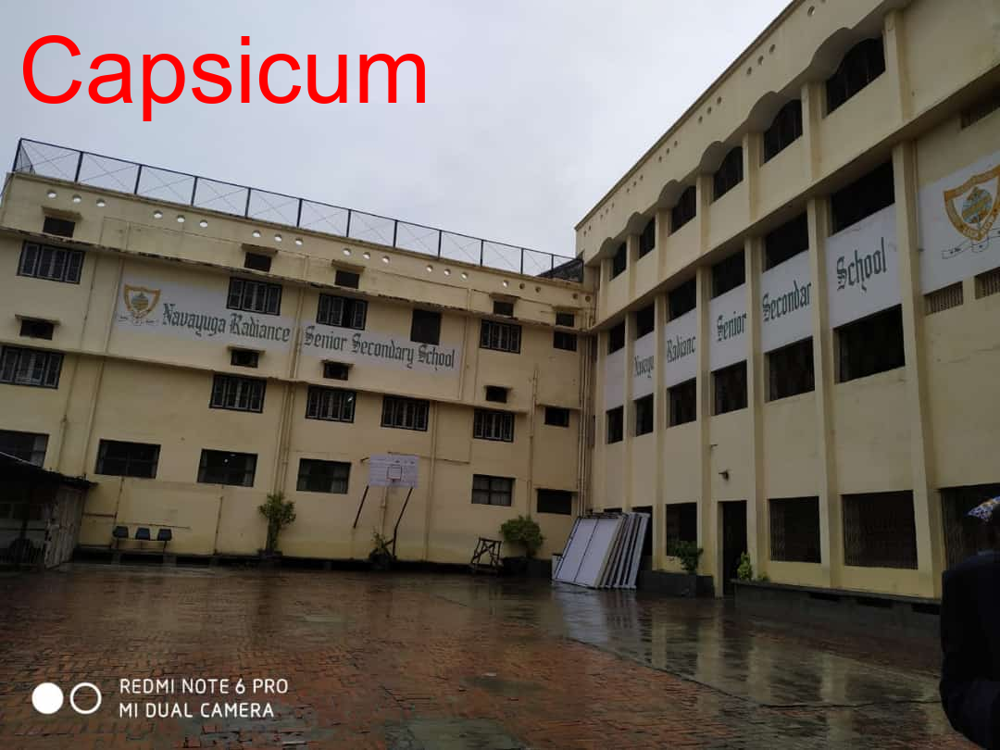

In [64]:
drawIm2 = ImageDraw.Draw(im2)
drawIm2.text((20,20), 'Capsicum', fill = 'red', font = ImageFont.truetype('arial.ttf',100))
im2

In [65]:
im2.show()

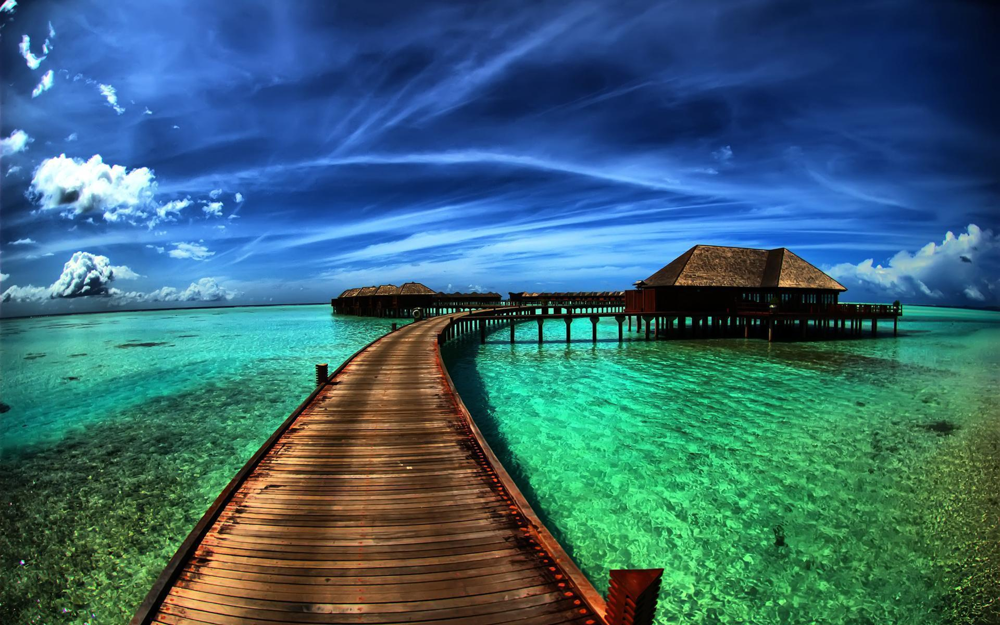

In [66]:
im1

im1.rotate(90)

In [67]:
im1.rotate(30, expand=True, fillcolor='white').save('capsicum2.png')

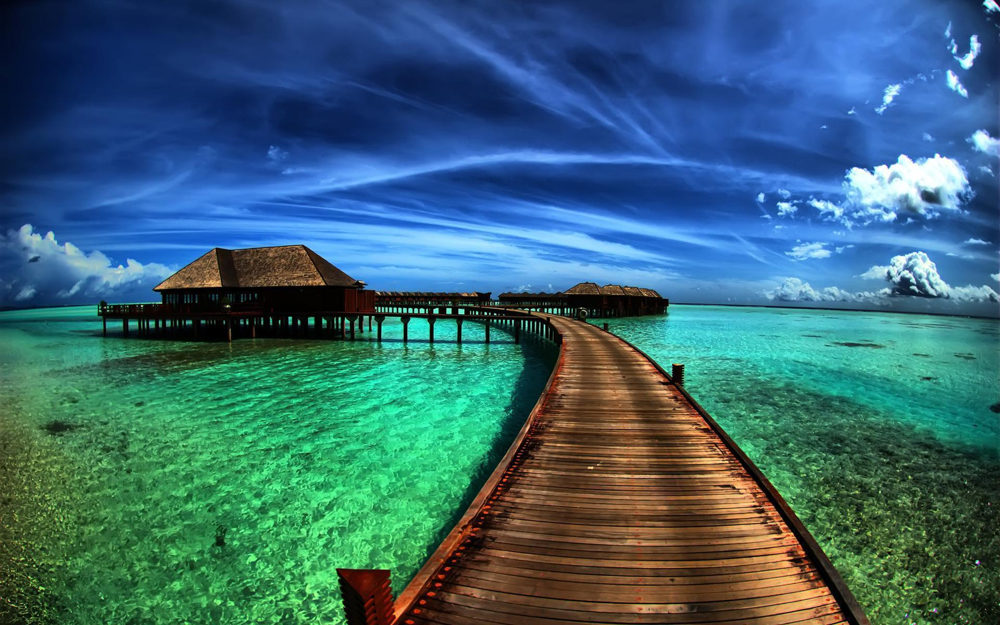

In [68]:
# IMAGE FLIP
im1.transpose(Image.Transpose.FLIP_LEFT_RIGHT)
# if u are getting error then use this
# im1.transpose(Image.FLIP_LEFT_RIGHT)

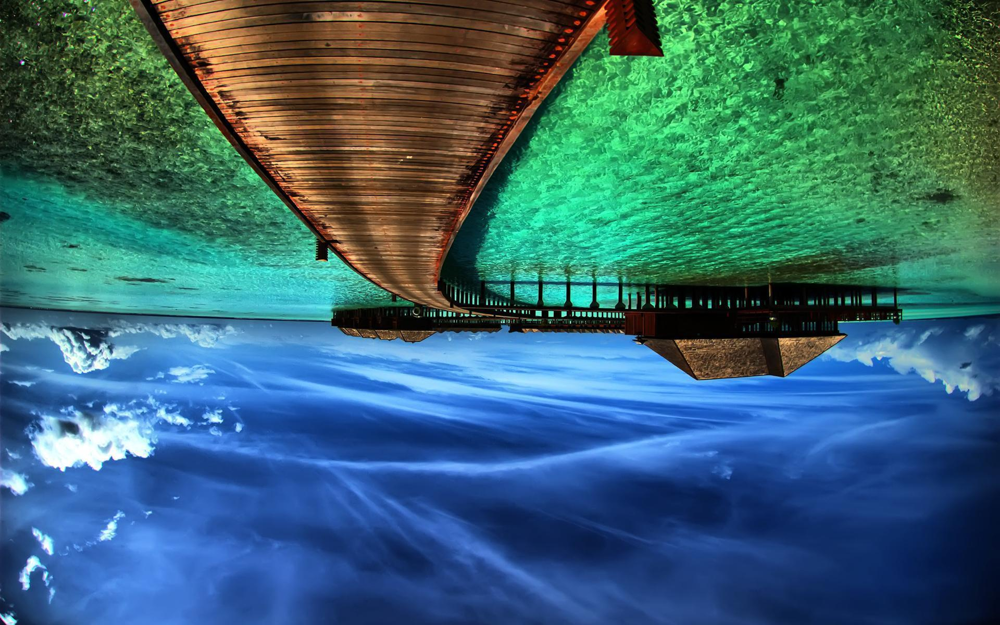

In [69]:
im1.transpose(Image.Transpose.FLIP_TOP_BOTTOM)

In [70]:
sky = download_img('https://img.freepik.com/free-photo/cloud-sky-twilight-times_74190-4017.jpg?w=2000')
sky.save('sky.jpg')

In [71]:
moon = download_img('https://www.instyle.com/thmb/IC68yjuWNIPNJHXCpx-qcK1Sqco=/1777x1333/smart/filters:no_upscale():focal(899x598:901x600)/102121-moon-water-lead-2000-d00cbc928a604b818117467988d3ca10.jpg')
moon.save('moon.jpg')

In [72]:
print("sky image resolution:",sky.size)
print('sky format:',sky.format)
print("moon image resolution:",moon.size)
print('moon format:',moon.format)

sky image resolution: (2000, 1333)
sky format: JPEG
moon image resolution: (1777, 1333)
moon format: JPEG


In [73]:
def blend_image(image_1,image_2,mode='RGB',size=(100,100),alpha=0.5):
    image_1 = image_1.resize(size)
    image_2 = image_2.resize(size)
    image_1 = image_1.convert(mode)
    image_2 = image_2.convert(mode)
    #image_1 = image_1.convert('RGBA')
    #image_2 = image_2.convert('RGBA')
    blended_image = Image.blend(image_1,image_2,alpha)
    return blended_image

In [74]:
blend_image(im2,im1,alpha=0.5,size=(1000,1000)).show()
#blend_image(sky,moon,alpha=0.3,size=(1000,1000)).show()

In [75]:
icon = Image.open(r'C:\Users\ACER\Documents\digipython\images\puppy.png')

In [76]:
icon.size

(900, 1219)

In [77]:
im1 = im1.convert('RGBA')
im1.paste(icon,(0,0))
im1.show()

In [78]:
im1.paste(icon,(200,200))
im1.show()

In [79]:
def add_watermark(image,watermark,style=None,pos=(0,0)):
    image = image.convert('RGBA')              # convert image to RGBA
    watermark = watermark.convert('RGBA')      # convert watermark to RGBA
    if style == 'tile':
        for x in range(0,image.width,watermark.width):
            for y in range(0,image.height,watermark.height):
                image.paste(watermark,(x,y),mask=watermark)
    elif style is None:
        image.paste(watermark, pos, mask=watermark)
    return image

In [82]:
add_watermark(sky,icon,pos=(im2.width-100,im2.height-100)).show()

In [87]:
from PIL import ImageFilter

In [89]:
filters = [
    ImageFilter.BLUR,
    ImageFilter.CONTOUR,
    ImageFilter.DETAIL,
    ImageFilter.EDGE_ENHANCE,
    ImageFilter.EMBOSS,
    ImageFilter.FIND_EDGES,
    ImageFilter.SMOOTH,
    ImageFilter.MaxFilter(7),
    ImageFilter.MinFilter(7),
    ImageFilter.MedianFilter(3),
    ImageFilter.GaussianBlur(30),
    ImageFilter.ModeFilter(3),
    ImageFilter.RankFilter(3,3),

]

for i,filter in enumerate(filters):
    moon.filter(filter).save(f'moon_{i}.png')